# Short Term Water Demand Forecasting with Statistical and AI Methods

### Oscar Wooding
Department of Civil and Environmental Engineering, Imperial College London

### Initial Statistical Analysis


In [1]:
# imports 
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import rc
import matplotlib_inline
import datetime as dt
import warnings
from scipy import stats

from sklearn.impute import KNNImputer
from statsmodels.tsa.seasonal import MSTL

# imports for time series analysis
import latex
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

# box-cox transformation for skeewed data
from scipy.stats import boxcox
from scipy.special import inv_boxcox

%matplotlib inline

pd.options.display.float_format = "{:,.2f}".format
np.set_printoptions(precision=2)

# improve matlab output
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams.update({
    "text.usetex": False,
    "font.family": "sans-serif",
    "font.sans-serif": "Helvetica",
})
plt.rc('font', size=10)          # controls default text sizes
plt.rc('axes', titlesize=12)     # fontsize of the axes title
plt.rc('axes', labelsize=11)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
plt.rc('legend', fontsize=10)    # legend fontsize
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# adjust the format of the data set
pd.options.display.float_format = '{:,.2f}'.format
np.set_printoptions(precision=2)

warnings.filterwarnings("ignore")


### *Load*

In [2]:
# load inflow data
inflow_data = pd.read_csv("../data/InflowDataImputedNoanomoly.csv")

# make list with dma names
dma_list = list(inflow_data.columns.values[1:])

# male list with dma description
dma_descripton = ["Hospital district",
                   "Residential district in the countryside",
                   "Residential district in the countryside",
                   "Suburban residential/commercial district",
                   "Residential/commercial district close to the city centre",
                   "Suburban district including sport facilities and office buildings",
                   "Residential district close to the city centre",
                   "City centre district",
                   "Commercial/industrial district close to the port",
                   "Commercial/industrial district close to the port"]

# make list with information of users supplied
users_supplied = [162,531,607,2094,7955,1135,3180,2901,425,776]

# make list with average net inflow
av_net_inflo = [8.4,9.6,4.3,32.9,78.3,8.1,25.1,20.8,20.6,26.4]

inflow_data = inflow_data.set_index('date_time')

# change index format to datetime
inflow_data.index = pd.to_datetime(inflow_data.index)

dmas = list(inflow_data.columns)

# # print first two rows
inflow_data.head(3)


,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
date_time,,,,,,,,,,
2021-01-01 00:00:00,4.93,8.32,3.70,26.79,57.40,6.68,17.06,19.87,16.85,22.17
2021-01-01 01:00:00,4.79,8.09,3.56,23.80,56.32,6.41,14.87,19.25,16.95,21.22
2021-01-01 02:00:00,4.75,7.79,3.27,23.03,59.61,6.17,13.78,19.17,16.58,22.62


In [56]:
# load weather data
weather_data = pd.read_csv("../data/WeatherDataImputed.csv")

weather_data = weather_data.set_index('date_time')

# change index format to datetime
weather_data.index = pd.to_datetime(weather_data.index)

# # print first two rows
weather_data.head(3)


,rain_depth,air_temp,air_humid,windspeed,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,...,dma_i,dma_j,day,hour,season,month,official_holiday,legally_not_recongnized_holidays,event_day,weekend
date_time,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,0.00,7.20,79.00,9.00,4.93,8.32,3.70,26.79,57.40,6.68,...,16.85,22.17,4,0,1,1,1,0,0,0
2021-01-01 01:00:00,0.00,7.30,79.00,6.00,4.79,8.09,3.56,23.80,56.32,6.41,...,16.95,21.22,4,1,1,1,1,0,0,0
2021-01-01 02:00:00,0.00,7.60,78.00,4.00,4.75,7.79,3.27,23.03,59.61,6.17,...,16.58,22.62,4,2,1,1,1,0,0,0


### *Visualise*

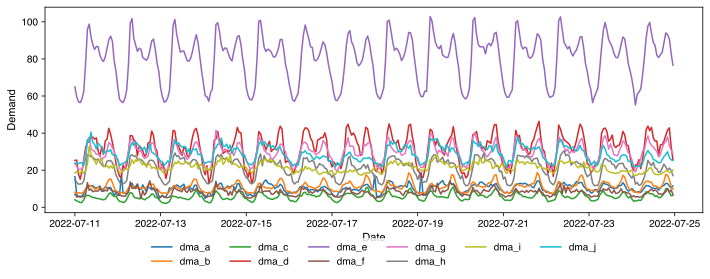

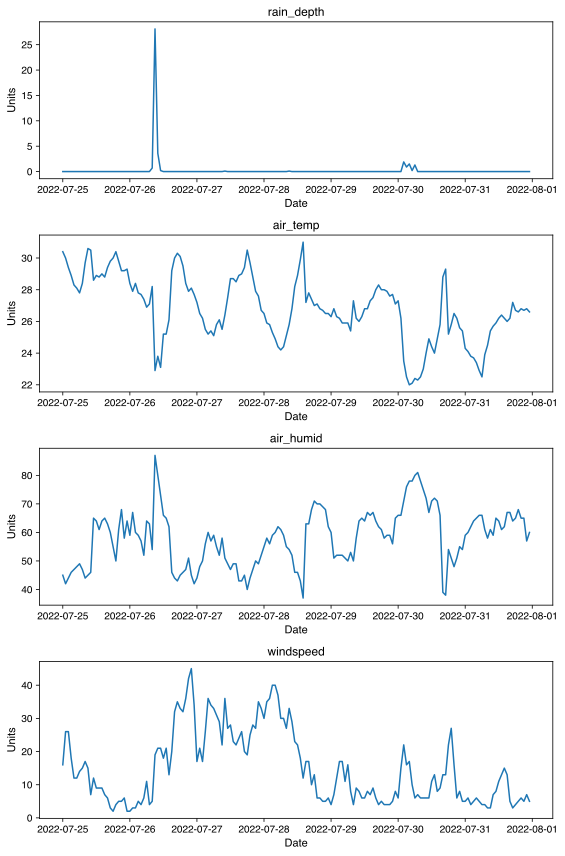

In [4]:
# total dataset
# demand
no_timesteps, no_dma = inflow_data.shape

fig, axs = plt.subplots(1, 1, figsize=(10, 4))

axs.plot(inflow_data.iloc[-24*14:, :], label=inflow_data.columns)
axs.set_xlabel('Date')
axs.set_ylabel('Demand')

leg = axs.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
    fancybox=False, shadow=False, ncol=6, edgecolor='w', borderpad=0.5)
leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

# weather
fig, axs = plt.subplots(4, 1, figsize=(8, 12))

for i, col in enumerate(weather_data.columns): 
    axs[i].plot(weather_data.iloc[-24*7:, :][col], label=col)
    axs[i].set_title(col)
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Units')

fig.tight_layout()
plt.show()


### Data Analysis

#### 0. Statistical Properties

In [5]:
# basic statistical properties
stats = {dma: {} for dma in dmas}

for i, dma in enumerate(dmas): 
    stats[dma]['readings'] = len(inflow_data[dma])
    stats[dma]['min_demand'] = inflow_data[dma].min()
    stats[dma]['quartile_lower'] = np.percentile(inflow_data[dma], 25)
    stats[dma]['median'] = np.percentile(inflow_data[dma], 50)
    stats[dma]['quartile_upper'] = np.percentile(inflow_data[dma], 75)
    stats[dma]['max_demand'] = inflow_data[dma].max()
    stats[dma]['std'] = inflow_data[dma].std()
    stats[dma]['mode'] = inflow_data[dma].mode()
    stats[dma]['mean'] = inflow_data[dma].mean()
    stats[dma]['skewness'] = inflow_data.skew()
    stats[dma]['kurtosis'] = inflow_data.kurt()
    stats[dma]['dma_type'] = dma_descripton[i]
    stats[dma]['users_supplied'] = users_supplied[i]

stats 

{'dma_a': {'readings': 13678,
  'min_demand': 2.12,
  'quartile_lower': 6.39,
  'median': 8.32,
  'quartile_upper': 10.27,
  'max_demand': 23.4,
  'std': 2.70113813839142,
  'mode': 0   8.07
  Name: dma_a, dtype: float64,
  'mean': 8.368444272374546,
  'skewness': dma_a    0.24
  dma_b    1.03
  dma_c    0.88
  dma_d   -0.23
  dma_e   -0.31
  dma_f    0.26
  dma_g   -0.22
  dma_h   -0.32
  dma_i    0.69
  dma_j    0.25
  dtype: float64,
  'kurtosis': dma_a   -0.10
  dma_b    1.68
  dma_c    1.18
  dma_d   -0.71
  dma_e   -0.98
  dma_f   -0.19
  dma_g   -0.53
  dma_h   -1.10
  dma_i    0.45
  dma_j   -0.82
  dtype: float64,
  'dma_type': 'Hospital district',
  'users_supplied': 162},
 'dma_b': {'readings': 13678,
  'min_demand': 6.27,
  'quartile_lower': 8.32,
  'median': 9.29,
  'quartile_upper': 10.57,
  'max_demand': 18.77,
  'std': 1.8482700188753012,
  'mode': 0   8.84
  Name: dma_b, dtype: float64,
  'mean': 9.579250323490108,
  'skewness': dma_a    0.24
  dma_b    1.03
  dma_c   

#### 1. Correlation

In [6]:
# correlation between different dma
lagged_inflow_data = inflow_data.copy()
for i in np.arange(1, 25): 
    for col in inflow_data.iloc[:, :10]: 
        label = col + '_+' + str(i)
        lagged_inflow_data[label] = inflow_data[col].shift(i)
    
inflow_data.corr()


,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
dma_a,1.00,0.59,0.62,0.43,0.55,0.08,0.60,0.56,0.49,0.65
dma_b,0.59,1.00,0.92,0.64,0.68,0.13,0.67,0.55,0.35,0.55
dma_c,0.62,0.92,1.00,0.65,0.71,0.17,0.73,0.57,0.33,0.55
dma_d,0.43,0.64,0.65,1.00,0.91,0.57,0.81,0.83,0.40,0.64
dma_e,0.55,0.68,0.71,0.91,1.00,0.56,0.91,0.92,0.53,0.76
dma_f,0.08,0.13,0.17,0.57,0.56,1.00,0.57,0.60,0.24,0.37
dma_g,0.60,0.67,0.73,0.81,0.91,0.57,1.00,0.86,0.47,0.71
dma_h,0.56,0.55,0.57,0.83,0.92,0.60,0.86,1.00,0.64,0.85
dma_i,0.49,0.35,0.33,0.40,0.53,0.24,0.47,0.64,1.00,0.87
dma_j,0.65,0.55,0.55,0.64,0.76,0.37,0.71,0.85,0.87,1.00


In [77]:
pd.concat([weather_data, inflow_data[dmas]], axis=1).dropna(how=dmas)

ValueError: invalid how option: ['dma_a', 'dma_b', 'dma_c', 'dma_d', 'dma_e', 'dma_f', 'dma_g', 'dma_h', 'dma_i', 'dma_j']

In [7]:
# correlation between different dma and their lag
c = lagged_inflow_data.corr()

high_corr = {}
thresh = 0.8  # threshold value of correlation for printed output

for row in c.columns: 
    for col in c.columns: 
        if (row != col)and (row[-3:] != col[-3:])and(row[-3]!='+' or row[-3]!='+')and(row[-2]!='+' or row[-2]!='+'): 
            if c.loc[row, col] > thresh:
                key = (row, col)
                high_corr[key] = c.loc[row, col]

high_corr


{('dma_a', 'dma_a_+1'): 0.8108428476894445,
 ('dma_b', 'dma_c'): 0.9192694571021042,
 ('dma_b', 'dma_b_+1'): 0.9085313128900538,
 ('dma_b', 'dma_c_+1'): 0.8468468757472868,
 ('dma_b', 'dma_b_+23'): 0.8519583329117394,
 ('dma_b', 'dma_c_+23'): 0.8055554401190173,
 ('dma_b', 'dma_b_+24'): 0.9169549829480036,
 ('dma_b', 'dma_c_+24'): 0.8669703515894209,
 ('dma_c', 'dma_b'): 0.9192694571021042,
 ('dma_c', 'dma_b_+1'): 0.8513516874290947,
 ('dma_c', 'dma_c_+1'): 0.8984119345927498,
 ('dma_c', 'dma_b_+23'): 0.8033334858632961,
 ('dma_c', 'dma_c_+23'): 0.8285669960508953,
 ('dma_c', 'dma_b_+24'): 0.866827821320536,
 ('dma_c', 'dma_c_+24'): 0.9029358459560003,
 ('dma_d', 'dma_e'): 0.9099423796946048,
 ('dma_d', 'dma_g'): 0.8056962604470178,
 ('dma_d', 'dma_h'): 0.8295776792692036,
 ('dma_d', 'dma_d_+1'): 0.8344093020397045,
 ('dma_d', 'dma_e_+23'): 0.8095287830102564,
 ('dma_d', 'dma_d_+24'): 0.8778152931452743,
 ('dma_d', 'dma_e_+24'): 0.8786844799983039,
 ('dma_d', 'dma_h_+24'): 0.8233909010

In [9]:
# plotting demand correlation to prior timesteps of importance
import random

fig, axs = plt.subplots(10, 3, figsize=(12, 24))

lags = [1, 24, 24*7]

fig.suptitle('Correlation between demand at t, t-1, t-24, and t-24*7 ', fontsize=12, y=1)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for j, lag in enumerate(lags): 
        
        data = inflow_data.dropna()[0:3000]
        
        sample = pd.DataFrame()
        sample['x'] = data[dma]
        sample['y'] = data.shift(lag)[dma]
        sample = sample.dropna()
        
        # Plotting the histogram.
        axs[i][j].scatter(sample['x'], sample['y'], s=60, alpha=0.7, edgecolors="k")
        
        # get correlation
        corr = np.corrcoef(sample['x'], sample['y'])[0][1]

        # Fit linear regression via least squares with numpy.polyfit
        # It returns an slope (b) and intercept (a)
        # deg=1 means linear fit (i.e. polynomial of degree 1)
        b, a = np.polyfit(sample['x'], sample['y'], deg=1)
        
        xmin, xmax = 0, inflow_data[dma].max() * 1.2
        
        # Create sequence of 100 numbers from 0 to 100 
        xseq = np.linspace(xmin, xmax, num=100)

        # Plot regression line
        axs[i][j].plot(xseq, a + b * xseq, color="k", lw=1);
    
        axs[i][j].set_title(dma + ' : corr ' + repr(corr)[:3] + ': t-' + str(lag))
        axs[i][j].set_xlabel('demand')
        axs[i][j].set_ylabel('frequency density')

fig.tight_layout()
plt.show()


#### 1.1 Comments on Correlation

- 
- 

#### 2. Averaging

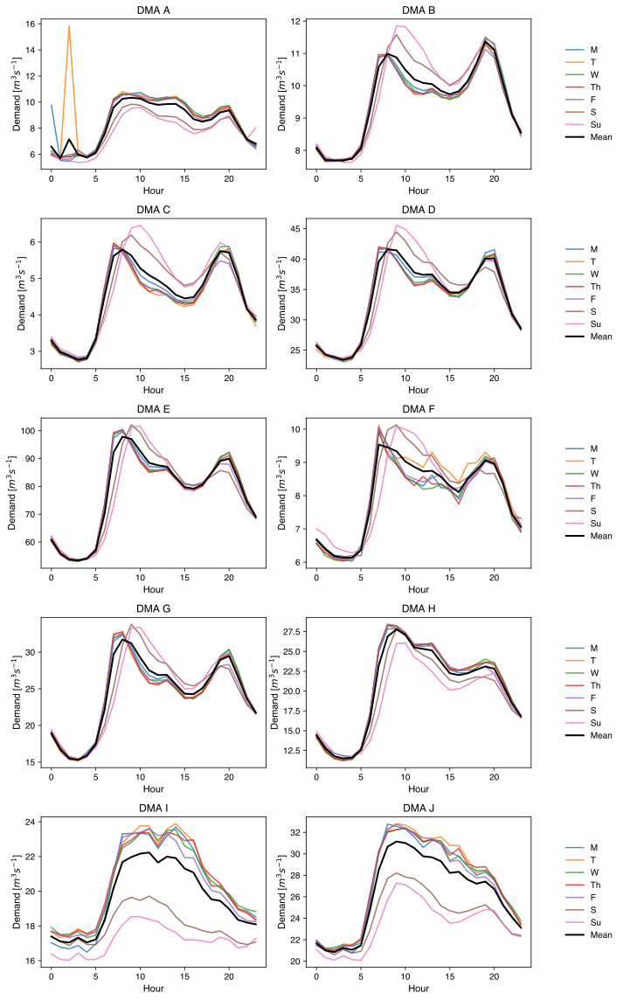

In [10]:
# plotting weekday averages
inflow_data['day'] = inflow_data.index.weekday
inflow_data['hour'] = inflow_data.index.hour

days = ['M', 'T', 'W', 'Th', 'F', 'S', 'Su']

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

#fig.suptitle('Average daily variation by dma by day', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for day in np.arange(7): 
        axs[i].plot(inflow_data[inflow_data['day']==day].groupby(by='hour').mean()[dma], label=days[day], alpha=0.8)
        axs[i].set_title('DMA '+dma[-1].upper())
        axs[i].set_xlabel('Hour')
        axs[i].set_ylabel('Demand [$m^3s^{-1}$]')
    axs[i].plot(inflow_data.groupby(by='hour').mean()[dma], label='Mean', color='black', linewidth=2)
    if i % 2 == 1: 
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.4, 0.5),
                fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)
    
fig.tight_layout()


plt.show()



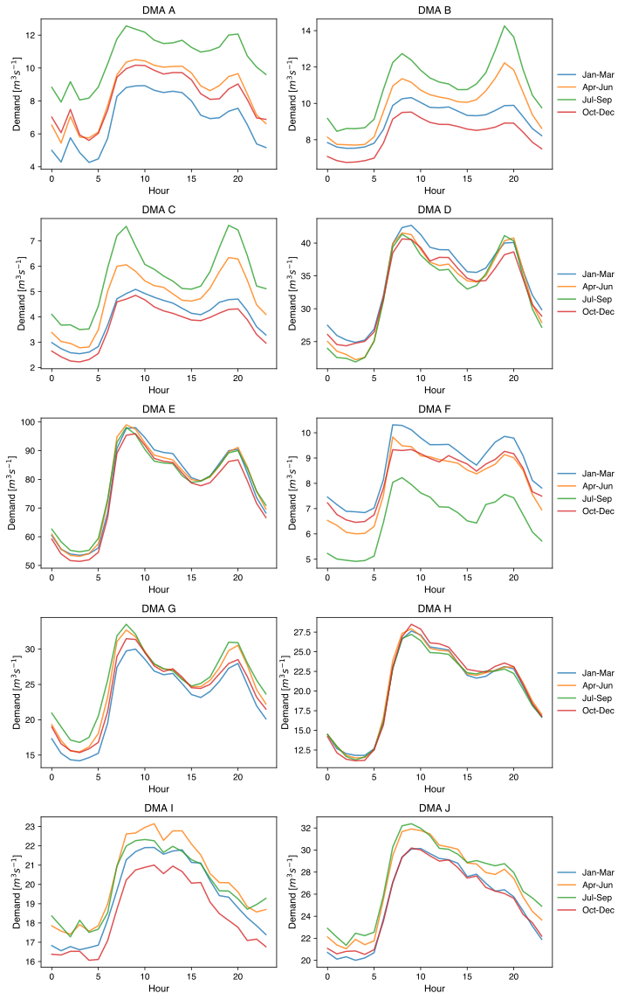

In [11]:
# plotting seasonal variation
inflow_data['season'] = inflow_data.index.quarter

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()
seasons = ['Jan-Mar', 'Apr-Jun', 'Jul-Sep', 'Oct-Dec']

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for season in np.arange(4): 
        axs[i].plot(inflow_data[inflow_data['season']==season+1].groupby(by='hour').mean()[dma], label=seasons[season], alpha=0.8)
        axs[i].set_title('DMA '+dma[-1].upper())
        axs[i].set_xlabel('Hour')
        axs[i].set_ylabel('Demand [$m^3s^{-1}$]')
    
    if i % 2 == 1: 
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
fig.savefig('../data/graphs/dma_average_seasons_hourly.png')
plt.show()


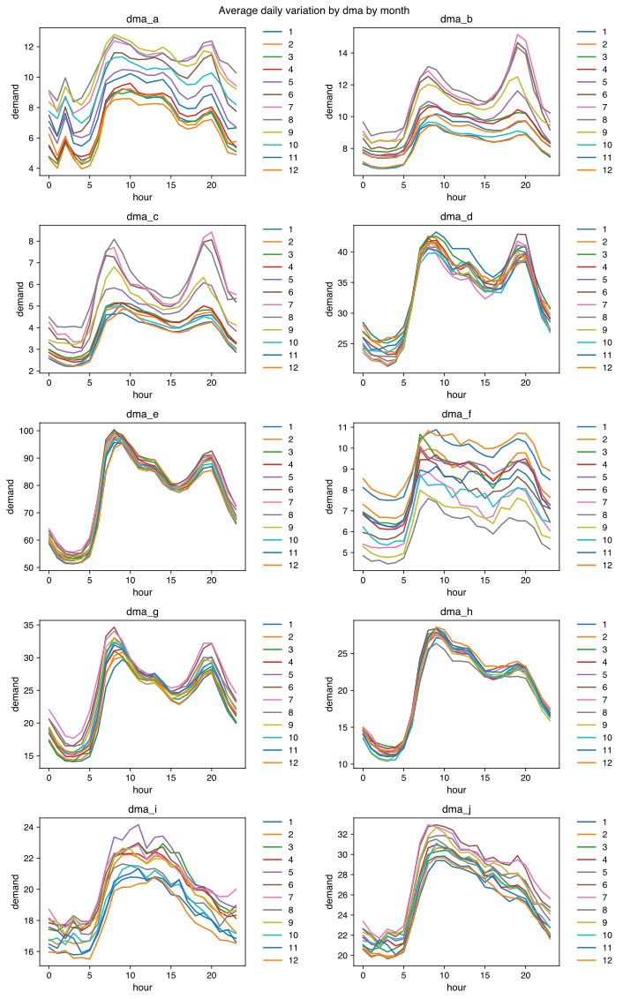

In [12]:
# plotting monthly variation
inflow_data['month'] = inflow_data.index.month

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by month', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for month in np.arange(12): 
        axs[i].plot(inflow_data[inflow_data['month']==month+1].groupby(by='hour').mean()[dma], label=month+1)
        axs[i].set_title(dma)
        axs[i].set_xlabel('hour')
        axs[i].set_ylabel('demand')
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


#### 3. Distributions

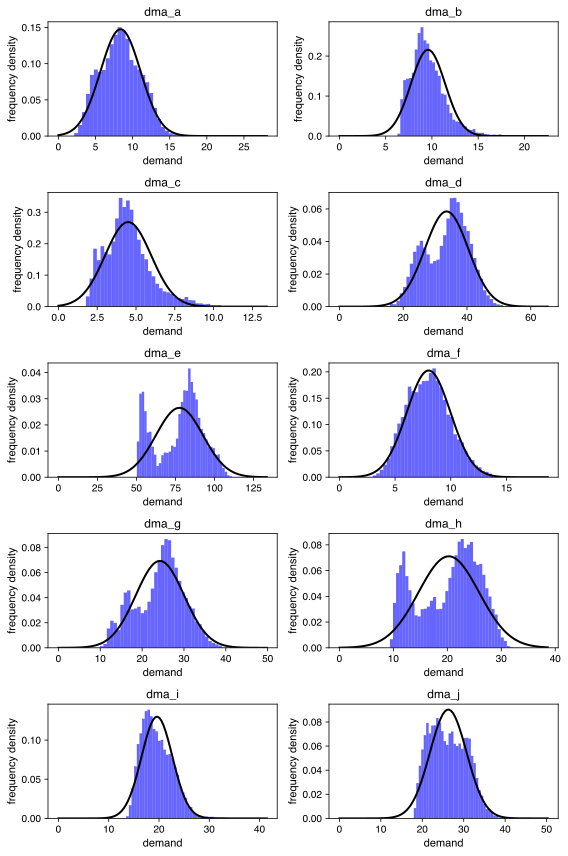

In [21]:
# plotting dma demand distributions vs normal
from scipy.stats import norm

fig, axs = plt.subplots(5, 2, figsize=(8, 12))
axs = axs.flatten()

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    # Plotting the histogram.
    axs[i].hist(inflow_data[dma], bins=40, density=True, alpha=0.6, color='b')
    
    # Fit a normal distribution to
    # the data:
    # mean and standard deviation
    mu, std = norm.fit(inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = 0, inflow_data[dma].max() * 1.2
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'k', linewidth=2)
    axs[i].set_title(dma)
    axs[i].set_xlabel('demand')
    axs[i].set_ylabel('frequency density')

fig.tight_layout()
plt.show()

fig.savefig('../data/graphs/demand_distributions.png')

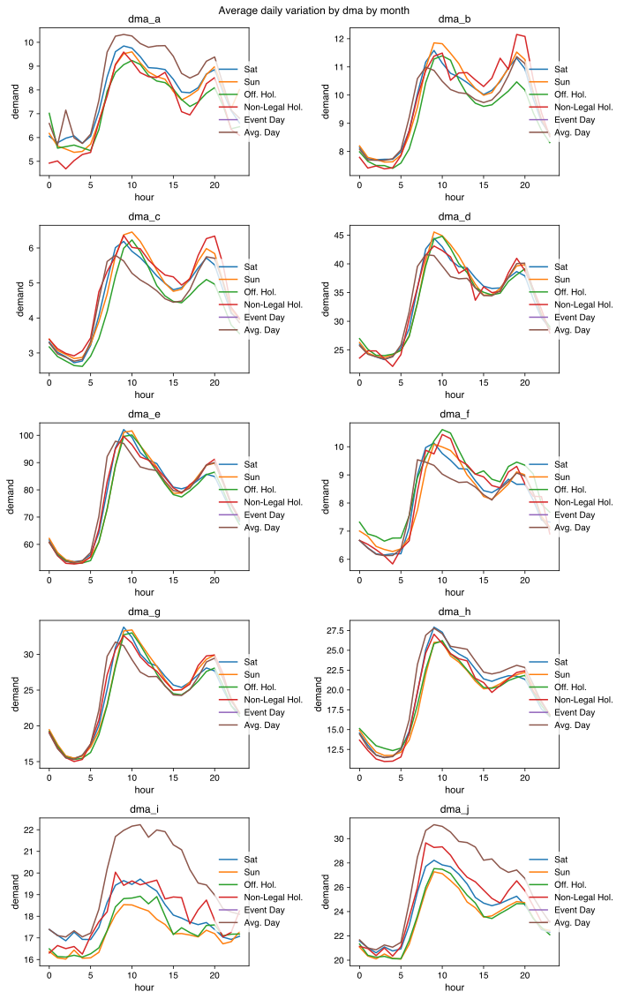

In [14]:
# comparison of weekends and holidays
# make list of special days for the DMAs region
official_holidays = ["2021-01-01","2021-01-06","2021-04-04","2021-04-05","2021-04-25","2021-05-01","2021-06-02","2021-08-15","2021-11-01","2021-12-05","2021-12-25","2021-12-26","2022-01-01","2022-01-06","2022-04-17","2022-04-18","2022-04-25","2022-05-01","2022-06-22","2022-08-15","2022-11-01","2022-12-08","2022-12-25","2022-12-26"]

legally_not_recongnized_holidays = ["2021-04-23","2021-05-23","2022-04-23","2022-06-05"]

event_day = ["2021-03-28","2021-05-09","2021-10-31","2021-11-28","2021-05-12","2021-12-12","2021-12-19","2021-12-31","2022-03-27","2022-04-10","2022-05-08","2022-05-09","2022-10-30","2022-11-27","2022-12-04","2022-12-11","2022-12-18","2022-12-31"]

# make columns for special days
inflow_data['official_holiday'] = 0
inflow_data['legally_not_recongnized_holidays'] = 0
inflow_data['event_day'] = 0
inflow_data['weekend'] = 0

# add indicator variable for speciall days
for i in inflow_data.index:
    if str(i)[:10] in official_holidays:
        inflow_data['official_holiday'][i] = 1

for i in inflow_data.index:
    if str(i)[:10] in legally_not_recongnized_holidays:
        inflow_data['legally_not_recongnized_holidays'][i] = 1

for i in inflow_data.index:
    if str(i)[:10] in event_day:
        inflow_data['event_day'][i] = 0

# add variable for weekend days
for i in inflow_data.index:
    if i.weekday() == 5 or i.weekday() == 6:
        inflow_data['weekend'][i] = 1
        
fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by month', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    axs[i].plot(inflow_data[inflow_data['day']==5].groupby(by='hour').mean()[dma], label='Sat')
    axs[i].plot(inflow_data[inflow_data['day']==6].groupby(by='hour').mean()[dma], label='Sun')
    axs[i].plot(inflow_data[inflow_data['official_holiday']==1].groupby(by='hour').mean()[dma], label='Off. Hol.')
    axs[i].plot(inflow_data[inflow_data['legally_not_recongnized_holidays']==1].groupby(by='hour').mean()[dma], label='Non-Legal Hol.')
    axs[i].plot(inflow_data[inflow_data['event_day']==1].groupby(by='hour').mean()[dma], label='Event Day')
    axs[i].plot(inflow_data.groupby(by='hour').mean()[dma], label='Avg. Day')
    
    axs[i].set_title(dma)
    axs[i].set_xlabel('hour')
    axs[i].set_ylabel('demand')
    leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


Mean: 8.368444, StandardDeviation: 2.701039
Mean: 9.579250, StandardDeviation: 1.848202
Mean: 4.493210, StandardDeviation: 1.483752
Mean: 33.603274, StandardDeviation: 6.818002
Mean: 77.533814, StandardDeviation: 15.034389
Mean: 8.010738, StandardDeviation: 1.967942
Mean: 24.250314, StandardDeviation: 5.753218
Mean: 20.271400, StandardDeviation: 5.609169
Mean: 19.600635, StandardDeviation: 3.071091
Mean: 26.276055, StandardDeviation: 4.416219


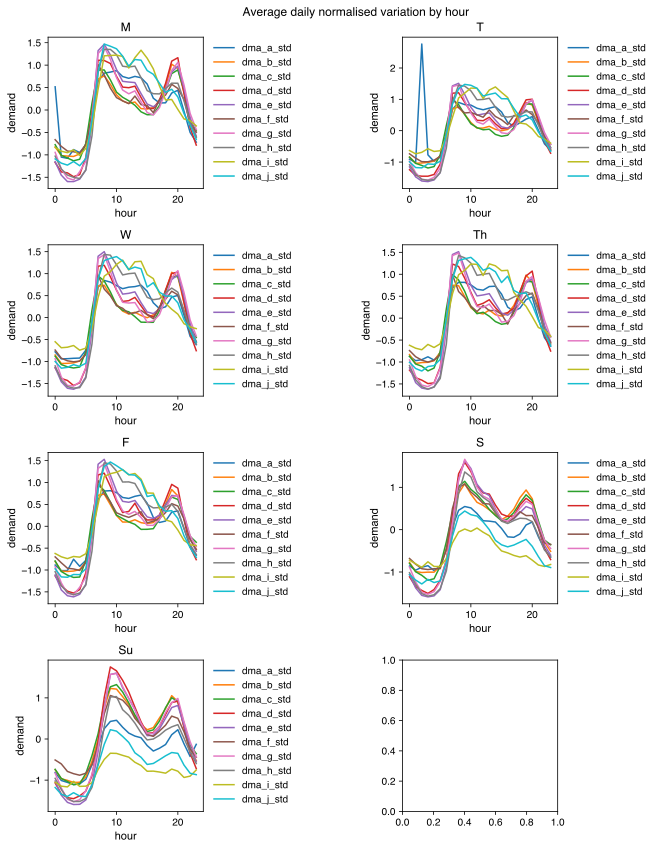

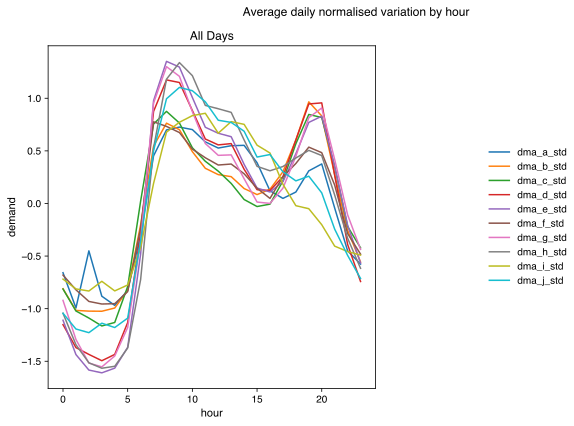

In [15]:
# similarity analysis between dmas
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from math import sqrt

# get standardised values
inflow_std = pd.DataFrame()
inflow_std.index = inflow_data.index

for dma in inflow_data.iloc[:, :10].columns: 
    
    # extract vals
    values = inflow_data[dma].values
    values = values.reshape((len(values), 1))

    # train the standardization
    scaler_std = StandardScaler()
    scaler_std = scaler_std.fit(values)
    print('Mean: %f, StandardDeviation: %f' % (scaler_std.mean_, sqrt(scaler_std.var_)))
    
    # transform
    standardized = scaler_std.transform(values)
    name = dma + '_std'
    inflow_std[name] = standardized.flatten()

inflow_std['hour'] = inflow_data['hour']
inflow_std['day'] = inflow_data['day']

# plot
fig, axs = plt.subplots(4, 2, figsize=(10, 12))
axs = axs.flatten()

fig.suptitle('Average daily normalised variation by hour', fontsize=12)

for day in np.arange(7):
    for dma in inflow_std.iloc[:, :10].columns: 
        axs[day].plot(inflow_std[inflow_std['day']==day].groupby(by='hour').mean()[dma], label=dma)
        axs[day].set_title(days[day])
        axs[day].set_xlabel('hour')
        axs[day].set_ylabel('demand')
        leg = axs[day].legend(loc='right', bbox_to_anchor=(1.6, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 1, figsize=(10, 6))

fig.suptitle('Average daily normalised variation by hour', fontsize=12)

for dma in inflow_std.iloc[:, :10].columns: 
    axs.plot(inflow_std.groupby(by='hour').mean()[dma], label=dma)
    axs.set_title('All Days')
    axs.set_xlabel('hour')
    axs.set_ylabel('demand')
    leg = axs.legend(loc='right', bbox_to_anchor=(1.6, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


#### 4. Stationarity

In [16]:
#Stationary Test
from statsmodels.tsa.stattools import adfuller

for dma in dmas: 
    adf,pvalue,usedlag_,nobs,critical_values,icbest = adfuller(inflow_data[dma])
    print(f"{dma}: pvalue = {pvalue:.3f}, if pvalue > 0.05, data is not stationary")
    #Results show stationary value


dma_a: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_b: pvalue = 0.004, if pvalue > 0.05, data is not stationary
dma_c: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_d: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_e: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_f: pvalue = 0.007, if pvalue > 0.05, data is not stationary
dma_g: pvalue = 0.015, if pvalue > 0.05, data is not stationary
dma_h: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_i: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_j: pvalue = 0.000, if pvalue > 0.05, data is not stationary


In [17]:
#Kolmogorow-Smirnov Test for Normality
from scipy.stats import kstest

for dma in dmas: 
    print(kstest(inflow_data[dma],'norm'))
#Results are normally distributed


KstestResult(statistic=0.9942232061673913, pvalue=0.0, statistic_location=2.71, statistic_sign=-1)
KstestResult(statistic=0.999999999819476, pvalue=0.0, statistic_location=6.27, statistic_sign=-1)
KstestResult(statistic=0.9716077244876294, pvalue=0.0, statistic_location=2.1, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=12.66, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=48.68, statistic_sign=-1)
KstestResult(statistic=0.9988565960415047, pvalue=0.0, statistic_location=3.07, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=9.13, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=9.36, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=13.48, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=17.95, statistic_sign=-1)


NameError: name 'quarter' is not defined

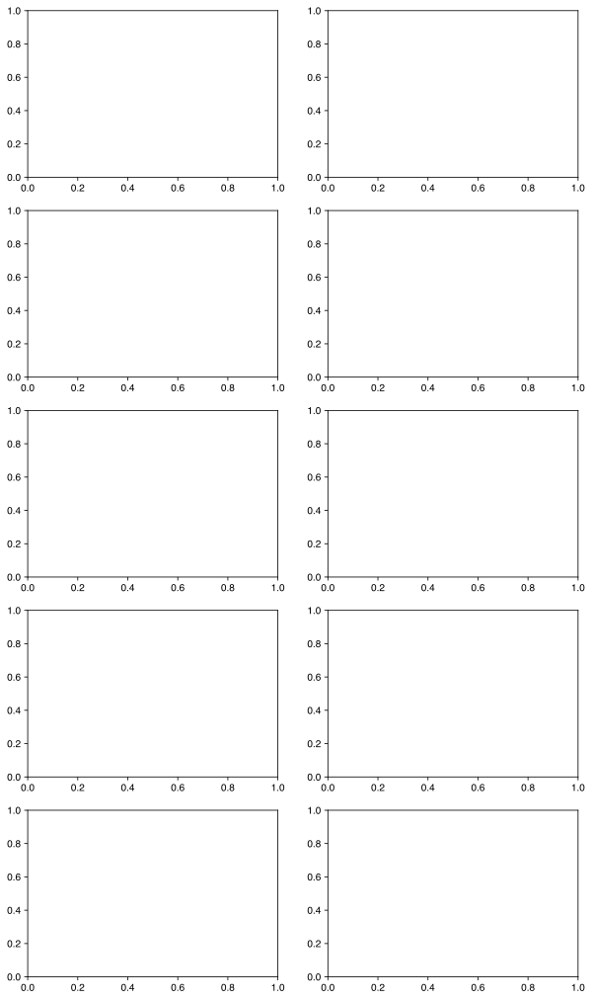

In [19]:
# AC and PAC for raw data
fig, axs = plt.subplots(5, 2, figsize=(10, 18))

for i, dma in enumerate(dmas[5:]): 
    
    adf,pvalue,usedlag_,nobs,critical_values,icbest = adfuller(inflow_data[dma], maxlag=24*7)
    
    # get plots for past year
    plot_acf(
        inflow_data[-24*365:][dma], 
        ax=axs[i][0], 
        lags=24*7, 
        use_vlines=True, 
        label=quarter, 
        title=f"Autocorrelation ({'DMA '+dma[-1].upper()}) - p value={pvalue.round(3)}"
    )

    plot_pacf(
        inflow_data[-24*365:][dma], 
        ax=axs[i][1], 
        use_vlines=True, 
        label=quarter,
        title=f"Partial Autocorrelation ({'DMA '+dma[-1].upper()})"
    )
    
# save result
fig.savefig('../data/graphs/raw_data_acf_pacf2.png')


In [ ]:
# differencing data 
diff_inflow_data = inflow_data.copy()
diff_inflow_data = diff_inflow_data.diff(periods=1)
diff_inflow_data = diff_inflow_data.diff(periods=24*7).dropna()


In [ ]:
# AC and PAC for differenced data
fig, axs = plt.subplots(5, 2, figsize=(10, 18))

for i, dma in enumerate(dmas[5:]): 
    
    adf,pvalue,usedlag_,nobs,critical_values,icbest = adfuller(diff_inflow_data[dma], maxlag=24*7)
    
    # get plots for past year
    plot_acf(
        diff_inflow_data[-24*365:][dma], 
        ax=axs[i][0], 
        lags=24*7, 
        use_vlines=True, 
        label=quarter, 
        title=f"Autocorrelation ({'DMA '+dma[-1].upper()}) - p value={pvalue.round(3)}"
    )

    plot_pacf(
        diff_inflow_data[-24*365:][dma], 
        ax=axs[i][1], 
        use_vlines=True, 
        label=quarter,
        title=f"Partial Autocorrelation ({'DMA '+dma[-1].upper()})"
    )
    
# save result
fig.savefig('../data/graphs/diff_data_acf_pacf2.png')


In [ ]:
#QQ plot
import statsmodels.api as sm
import pylab as py

for dma in dmas: 
    sm.qqplot(df[dma],line='45')
    py.show()

#Results show not normally distributed

#### 4. Decomposition

In [ ]:
# seasonal decompositions
#
for dma in dmas: 
    ts_data_load = inflow_data[dma]
    decomposition = sm.tsa.seasonal_decompose(
        ts_data_load[-1000:], period=24, model="additive"
    )

    fig = decomposition.plot()


### Statistical Models

In [3]:
# import
import datetime as dt
import math
import os
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from common.utils import load_data, mape
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.ar_model import AutoReg, ar_select_order


#### 1. Data Preparation

In [ ]:
# remove dupes
df_imputed = df_imputed[~df_imputed.index.duplicated(keep='first')]
weather_data = weather_data[~weather_data.index.duplicated(keep='first')]


#### 1.1 Transforms

In [ ]:
# find best boxcox transformation. Include datetime index if given
def boxcox_transform(df,lmda=None,alpha=None,optimizer=None):
    transform_df = df.copy()
    
    for col in df.columns:
        x = df[col]
        index = df.index
        
        if lmda == None:
            boxcox_data, lmda = boxcox(x, lmbda=None, alpha=None, optimizer=None)

        else:
            boxcox_data = boxcox(x, lmbda=lmda, alpha=None, optimizer=None)

        transform_df[col] = boxcox_data
        
    return transform_df

        
# reverse transformation. Include datetime index if given
def inv_boxcox_tranform(x, lmda, out=None):

    transform_df = df.copy()
    
    for col in df.columns:
        x = df[col]
        index = df.index
        
        if lmda == None:
            boxcox_data, lmda = inv_boxcox(x, lmbda=None, out=None)

        else:
            boxcox_data = inv_boxcox(x, lmbda=lmda, out=None)
        
        transform_df[col] = boxcox_data
        
    return transform_df
    

    
# min max transformation
def normalise(df): 
    
    norm_df = df.copy()
    
    for col in df.columns: 
        values = df[col].values
        values = values.reshape((len(values), 1))

        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler = scaler.fit(values)
        
        normalised = scaler.transform(values)
        
        norm_df[col] = normalised
    
    return norm_df
     
    
# standardise transformation
def standardise(df): 
    
    stand_df = df.copy()
    
    for col in df.columns: 
        values = df[col].values
        values = values.reshape((len(values), 1))

        scaler = StandardScaler()
        scaler = scaler.fit(values)
        
        standardised = scaler.transform(values)
        
        stand_df[col] = standardised
    
    return stand_df
        

In [ ]:
# box cox transform
bc_inflow_data = boxcox_transform(inflow_data[dmas])

# comparison of initial data and transform
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    
    # compare distributions of original and transformed data
    ax2 = axs[i].twiny()
    axs[i].set_title(dma)
    axs[i].hist(inflow_data[dma].values, density=True,bins=80,alpha=0.7)
    ax2.hist(bc_inflow_data[dma].values, density=True,bins=80, color='orange', alpha=0.7)
    
    # fit norm to original data
    # mean and standard deviation
    mu, std = norm.fit(inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = inflow_data[dma].min(), inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'blue', linewidth=2)
    
    # fit norm to transformed data
    # mean and standard deviation
    mu, std = norm.fit(bc_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = bc_inflow_data[dma].min(), bc_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    ax2.plot(x, p, 'orange', linewidth=2)
    
    axs[i].set_ylabel('Counts')
    axs[i].set_xlabel("L/s")
    ax2.set_xlabel("Transformed data", color='orange')

plt.show()
    

In [ ]:
# box cox transform
norm_inflow_data = normalise(inflow_data[dmas])
std_inflow_data = standardise(inflow_data[dmas])

# comparison of initial data and transform
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    
    # compare distributions of original and transformed data
    axs[i].set_title(dma)
    axs[i].hist(std_inflow_data[dma].values, density=False,bins=40, color='orange', alpha=0.7)
    axs[i].hist(norm_inflow_data[dma].values, density=False,bins=40,alpha=0.7)
    
    """
    # fit norm to original data
    # mean and standard deviation
    mu, std = norm.fit(norm_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = norm_inflow_data[dma].min(), norm_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'blue', linewidth=2)
    
    # fit norm to transformed data
    # mean and standard deviation
    mu, std = norm.fit(std_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = std_inflow_data[dma].min(), std_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    ax2.plot(x, p, 'orange', linewidth=2)
    
    axs[i].set_ylabel('Counts')
    axs[i].set_xlabel("L/s")
    ax2.set_xlabel("Transformed data", color='orange')
    """

plt.show()


#### 1.2 Splitting data

In [ ]:
# splitting data
train_start_dt = "2022-04-01 00:00:00"
inflow_df = inflow_data[(inflow_data.index >= train_start_dt)].copy()

# percentage of data for each split
train_pc = 0.8
no_train = len(inflow_df) - 168 #int(train_pc * len(inflow_df))
test_pc = 0.2
no_test = 168 #int(test_pc * len(inflow_df))

train = inflow_df.iloc[0:no_train, :][dmas].copy()
test = inflow_df.iloc[no_train:no_train+no_test, :][dmas].copy()
print("Training data shape: ", train.shape)
print("Test data shape: ", test.shape)


#### 2. AutoRegressive Model

In [ ]:
# comparison of prediction and training data
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    model = AutoReg(inflow_data[dma], 1)
    res = model.fit()
    res.plot_predict(no_train, no_train+no_test)
    print(f"{dma} results summary: ")
    print(results.summary())
    

In [ ]:
HORIZON = 1
print("Forecasting horizon:", HORIZON, "hours")

dma_dfs = {}

for dma in dmas: 
    test_shifted = test[[dma]].copy()
    for t in range(1, HORIZON):
        test_shifted[dma+'+'+str(t)] = test_shifted[dma].shift(-t, freq="H")
    
    test_shifted = test_shifted.dropna(how="any")
    dma_dfs[dma] = test_shifted
    
test_shifted.head(5)


In [ ]:
training_window = 24

# comparison of prediction and actual
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()
    
for i,dma in enumerate(['dma_a']): 
    train_ts = train[dma]
    test_ts = dma_dfs[dma]

    history = [x for x in train_ts]
    history = history[(-training_window):]

    predictions = list()

    # run autoreg model for each dma
    for t in range(test_ts.shape[0]):
        model = AutoReg(history, 1)
        model_fit = model.fit()
        yhat = model_fit.forecast(steps=3)
        predictions.append(yhat[0])
        obs = list(test_ts.iloc[t])
        history.append(obs[0])
        history.pop(0)
        
    axs[i].plot(train_ts[-training_window:], 'blue', linewidth=2, label='Observations')    
    axs[i].plot(test_ts.index, test_ts, 'blue', linewidth=2, label='Observations')
    axs[i].plot(test_ts.index, predictions, 'orange', linewidth=2, label='Predicted')
    axs[i].set_ylabel('demand')
    axs[i].set_xlabel("hours")
        
    leg = axs[i].legend(loc='right', bbox_to_anchor=(1.2, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
    leg.get_frame().set_linewidth(0.5)
    

In [6]:
import pywt

### Clustering Data to reduce DMAs in analysis

In [4]:
from sklearn.preprocessing import MinMaxScaler
from tslearn.clustering import TimeSeriesKMeans
import math

df = pd.read_csv('../data/InflowDataImputedNoanomoly.csv')
df = df[-672:].reset_index(drop=True)
df

,date_time,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
0,2022-06-27 00:00:00,17.79,8.61,5.03,24.64,65.61,6.56,23.18,15.35,19.70,24.64
1,2022-06-27 01:00:00,8.44,7.50,4.14,19.12,58.36,7.23,21.17,15.24,19.37,23.80
2,2022-06-27 02:00:00,8.55,7.94,3.72,16.96,56.44,6.97,19.69,12.47,17.11,21.38
3,2022-06-27 03:00:00,8.11,7.60,3.00,16.60,55.46,6.44,20.01,12.59,17.25,21.71
4,2022-06-27 04:00:00,11.15,7.62,3.29,21.15,56.87,6.75,20.98,12.03,17.84,22.09
...,...,...,...,...,...,...,...,...,...,...,...
667,2022-07-24 19:00:00,12.92,17.71,10.01,38.79,93.99,8.33,35.45,21.74,19.51,28.44
668,2022-07-24 20:00:00,12.84,17.35,10.06,41.67,93.13,10.13,37.98,19.97,19.71,30.01
669,2022-07-24 21:00:00,11.56,14.84,8.08,42.84,90.66,8.16,33.28,21.12,18.79,26.88
670,2022-07-24 22:00:00,10.42,11.57,6.19,32.83,83.15,9.42,30.68,19.86,18.73,25.57


In [5]:
mySeries = []

scaler = MinMaxScaler()
df.loc[:, df.columns != 'date_time'] = scaler.fit_transform(df.loc[:, df.columns != 'date_time'])

for col in df.loc[:, df.columns != 'date_time']: 
    mySeries.append(df[[col]])
    
mySeries

[     dma_a
 0     0.77
 1     0.22
 2     0.23
 3     0.21
 4     0.38
 ..     ...
 667   0.48
 668   0.48
 669   0.41
 670   0.34
 671   0.40
 
 [672 rows x 1 columns],
      dma_b
 0     0.14
 1     0.04
 2     0.08
 3     0.05
 4     0.06
 ..     ...
 667   0.91
 668   0.88
 669   0.67
 670   0.39
 671   0.24
 
 [672 rows x 1 columns],
      dma_c
 0     0.33
 1     0.23
 2     0.19
 3     0.11
 4     0.14
 ..     ...
 667   0.87
 668   0.88
 669   0.66
 670   0.46
 671   0.48
 
 [672 rows x 1 columns],
      dma_d
 0     0.36
 1     0.19
 2     0.13
 3     0.12
 4     0.25
 ..     ...
 667   0.78
 668   0.86
 669   0.90
 670   0.60
 671   0.39
 
 [672 rows x 1 columns],
      dma_e
 0     0.26
 1     0.12
 2     0.08
 3     0.06
 4     0.09
 ..     ...
 667   0.79
 668   0.78
 669   0.73
 670   0.59
 671   0.46
 
 [672 rows x 1 columns],
      dma_f
 0     0.21
 1     0.28
 2     0.26
 3     0.20
 4     0.23
 ..     ...
 667   0.39
 668   0.58
 669   0.38
 670   0.51
 671   0.26
 

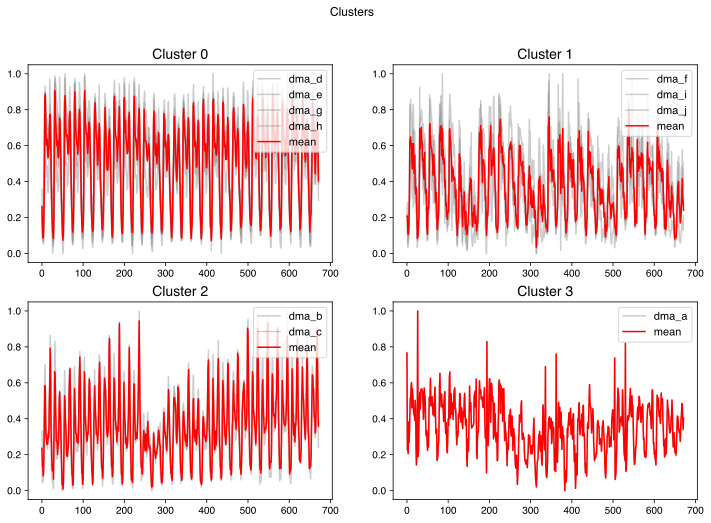

In [10]:
cluster_count = math.ceil(math.sqrt(len(mySeries)))
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(mySeries))))
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNNcoeffs[0].shape
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

labels = km.fit_predict(mySeries)

plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(plot_count,plot_count,figsize=(12,8))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(mySeries[i],c="gray",alpha=0.4,label=mySeries[i].columns[0])
                cluster.append(mySeries[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(cluster,axis=0),c="red",label='mean')
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j), fontsize=14)
    axs[row_i, column_j].legend(loc='upper right', fontsize=11)
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

# save result
fig.savefig('../data/graphs/dma_clusters.png')

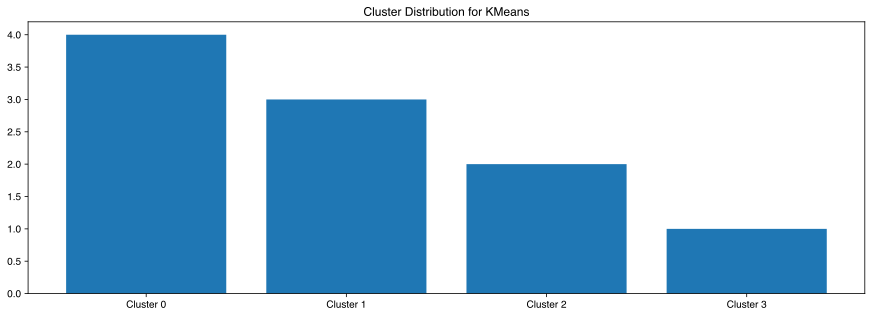

In [55]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["Cluster "+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()


In [56]:
fancy_names_for_labels = [f"Cluster {label}" for label in labels]
pd.DataFrame(zip(df.loc[:, df.columns != 'date_time'].columns,fancy_names_for_labels),columns=["Series","Cluster"]).sort_values(by="Cluster").set_index("Series")

,Cluster
Series,
dma_f,Cluster 0
dma_h,Cluster 0
dma_i,Cluster 0
dma_j,Cluster 0
dma_d,Cluster 1
dma_e,Cluster 1
dma_g,Cluster 1
dma_b,Cluster 2
dma_c,Cluster 2


In [68]:
# selecting dma with fewest missing data points in training period
df = inflow_data[-1008::]
for col in df.columns: 
    print(col)
    print(f"{df[col].isna().sum()}/n/n")

dma_a
1/n/n
dma_b
1/n/n
dma_c
2/n/n
dma_d
9/n/n
dma_e
30/n/n
dma_f
6/n/n
dma_g
2/n/n
dma_h
154/n/n
dma_i
0/n/n
dma_j
6/n/n
